# Metodología de Control de Calidad e Imputación de Datos de Series de Precipitación In Situ

## Objetivo
Esta metodología tiene como finalidad establecer un proceso robusto para la imputación de datos de precipitación in situ, utilizando técnicas modernas de Big Data y Machine Learning, complementadas con datos satelitales y bases de datos climáticas globales (como CHIRPS, ERA5, entre otras).

## 1. Preprocesamiento y Estandarización de Datos
Antes de aplicar cualquier proceso de control de calidad o imputación, es fundamental garantizar la correcta estructuración de los datos brutos o primarios.

La estructura base de una serie de datos estandarizada será:

| Index       | value |
|-------------|--------|
| 2020-01-01  | 2.53   |

- Index: tipo datetime, correspondiente a la fecha y hora de la observación.

- value: valor numérico registrado (precipitación en mm, por ejemplo).

Esta estructura debe representarse como una `pandas.Series` o un `pandas.DataFrame`, con índice tipo `datetime`.

## 2. Estructura de Control de Calidad
A partir de la serie estandarizada, se genera una estructura de control de calidad que enriquece la serie con metadatos asociados al resultado de las pruebas de calidad:

| Index       | value | qf | dp    |
|-------------|-------|----|-------|
| 2020-01-01  | 2.53  | 1  | 22358 |

- **qf (Quality Flag)**: código numérico que indica el resultado de una o varias pruebas de calidad.

- **dp (Descriptor de Proceso)**: identificador del proceso o técnica aplicada (detección, interpolación, imputación, etc.).

> ⚠️ La preservación de los datos originales es una prioridad. Las modificaciones solo deben aplicarse cuando la prueba indique una necesidad clara y bien justificada.

## 3. Pruebas de Control de Calidad
### 3.1. Consistencia Temporal
Una serie temporal debe tener frecuencia de muestreo constante. Esto significa que cada paso de tiempo entre observaciones debe ser homogéneo (e.g., diaria, horaria).

Proceso:
- Se analiza la frecuencia de muestreo mediante pandas.infer_freq o análisis de diferencias del índice.

- Si se detectan huecos en la serie (días u horas faltantes), se reindexa la serie para completar la malla temporal esperada.

    `df = df.asfreq('D')  # ejemplo para series diarias`
- A los puntos sin datos se les asigna un valor por defecto de -99999, conforme a estándares internacionales como los del IODE (International Oceanographic Data and Information Exchange).
    `df['value'].fillna(-99999, inplace=True)`

### 3.2. Otras Pruebas Básicas
- Rango Físico Aceptable: verifica que los valores estén dentro del rango físico o esperable (e.g., precipitación no puede ser negativa).

- Detección de valores extremos/anómalos: puede utilizarse el IQR, desviaciones estándar, o algoritmos robustos como Isolation Forest.

- Duplicados temporales: detección y resolución de registros con el mismo timestamp.

- Coherencia contextual: análisis de coherencia con estaciones vecinas o datos satelitales.

## 4. Imputación de Datos Faltantes
Una vez aplicada la batería de pruebas de calidad y etiquetados los valores anómalos o faltantes, se procede con la imputación de datos.

### 4.1. Fuentes de Información para la Imputación
- Estaciones vecinas (in situ).

- Datos satelitales (e.g., CHIRPS, GPM).

- Reanálisis climáticos (e.g., ERA5).

- Modelos estadísticos o de machine learning.

### 4.2. Técnicas de Imputación
- Interpolación temporal: lineal, spline, polinómica.

- K-Nearest Neighbors (KNN).

- Modelos de regresión multivariable (MLR).

- Redes neuronales (RNN, LSTM) para imputaciones complejas.

- Random Forest para variables con relaciones no lineales.

- La técnica aplicada se documenta en la columna dp, permitiendo rastrear el origen de cada dato imputado.

## 5. Estándares y Buenas Prácticas
- Trazabilidad: Toda modificación o imputación debe estar documentada y trazable.

- Conservación de Datos Originales: Mantener una copia sin modificar de la serie original.

- Reproducibilidad: Los scripts de calidad deben ser modulares y versionados.

- Evaluación Continua: Los algoritmos de imputación deben ser validados periódicamente frente a nuevas entradas de datos.

```
import pandas as pd

# Serie original
data = {'value': [2.53, 3.0, None, 2.1]}
index = pd.date_range(start='2020-01-01', periods=4, freq='D')
df = pd.DataFrame(data, index=index)

# Estructura de calidad
df['qf'] = [1, 1, 9, 1]  # 9 indica dato faltante
df['dp'] = [22358, 22358, 99999, 22358]
```
7. Resultados Esperados
- Series de precipitación limpias, consistentes, completas y trazables.

- Imputaciones realizadas con soporte técnico y científico.

- Alineación con estándares internacionales (WMO, IODE, etc.).

- Base sólida para análisis hidrometeorológicos, climatológicos o de gestión del recurso hídrico.



# Serie (redmpomm) Somo

In [1]:
from api_somo import APIClient, fetch_qf 
import logging
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Configuración del logger
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

api_url = "http://127.0.0.1:8000/database/functions/time-series/filter_date_serie/"
params = {
    "station_name": "gorgona",
    "variable_name": "Precipitación acumulada",
    "processing_level_name": "Control de calidad",
    "start_date": "2009-01-01",
    "end_date": "2023-12-31"
}

try:
    # 1. Solicitar y procesar los datos
    red_mpomm_serie, red_mpomm_metadata = APIClient.fetch_and_process_data(api_url, params)

    # Asegurar que el índice es datetime
    if not pd.api.types.is_datetime64_any_dtype(red_mpomm_serie.index):
        red_mpomm_serie.index = pd.to_datetime(red_mpomm_serie.index)

    if red_mpomm_serie.empty:
        raise ValueError("La serie histórica está vacía.")

    #logger.info(f"Serie histórica descargada correctamente. Columnas: {red_mpomm_serie.columns.tolist()}")

except Exception as e:
    logger.error(f"Error al obtener la serie histórica: {e}")
    red_mpomm_serie = pd.DataFrame()  # para evitar errores en siguientes pasos

# --- PROCESAMIENTO: FILTRAR CALIDAD ---
if not red_mpomm_serie.empty:
    # QF: Solo valores con calidad 1 o 3 son aceptados
    red_mpomm_serie.loc[~red_mpomm_serie['qf'].isin([1])] = np.nan
    red_mpomm_serie = red_mpomm_serie.drop(columns='qf')

    # Reporte de NaNs
    print('Reporte de datos NaN por columna:')
    print(red_mpomm_serie.isnull().sum())

    # Mostrar primeras filas
    red_mpomm_serie

INFO:api_somo:Sending request to http://127.0.0.1:8000/database/functions/time-series/filter_date_serie/ with parameters: {'station_name': 'gorgona', 'variable_name': 'Precipitación acumulada', 'processing_level_name': 'Control de calidad', 'start_date': '2009-01-01', 'end_date': '2023-12-31'}
INFO:api_somo:Original columns: ['date_time', 'sensor_data', 'quality_flag']
INFO:api_somo:Timestamp conversion and indexing complete.


Reporte de datos NaN por columna:
value    215993
dtype: int64


## Prerocesamiento serie redmpomm

En esta etapa se realiza un remuestreo de la serie a 3h ya que las series de apoyo que se utilizaran para el desarrollo de esta metodologia tienen una resolucion maxima de 3h, para esto tomamos una condicion en nustre serie la cual para ser sonsiderado el balor remuestreado debe contener mas del **80%** de los datos buenos, en el caso contrario dejara este espacio como un NaN
 

Reporte de datos NaN y/o null en la serie actual: 
value    12332
dtype: int64 



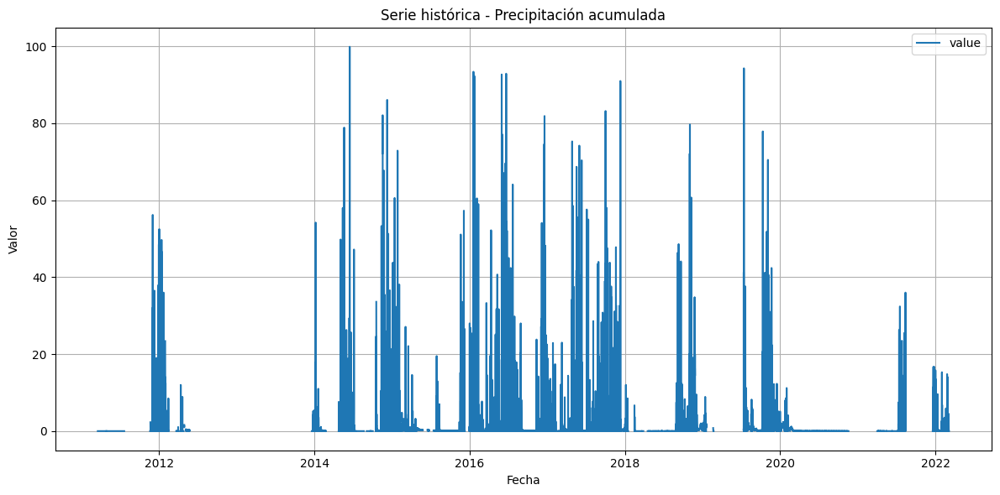

In [2]:
# Remuestreo condicional

# Función para eliminar grupos con más de un porcentaje de NaN
def custom_resample(group, nan_threshold=0.2):
    nan_ratio = group.isna().sum() / len(group)
    return group.sum() if nan_ratio < nan_threshold else np.nan

# Resampleo con diferentes períodos de agregación
red_mpomm_serie_3h = red_mpomm_serie.resample('3h').apply(lambda g: custom_resample(g, nan_threshold=0.2))
print('Reporte de datos NaN y/o null en la serie actual: ')
print(red_mpomm_serie_3h.isnull().sum(),'\n')

lower_bound = 0
upper_bound = 100
# Reemplazar outliers con NaN
red_mpomm_serie_3h['value'] = red_mpomm_serie_3h['value'].where((red_mpomm_serie_3h['value'] >= lower_bound) & (red_mpomm_serie_3h['value'] <= upper_bound), np.nan)

# --- GRAFICAR ---
plt.figure(figsize=(12, 6))
plt.plot(red_mpomm_serie_3h, label=red_mpomm_serie_3h.columns[0])
plt.xlabel('Fecha')
plt.ylabel('Valor')
plt.title('Serie histórica - Precipitación acumulada')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

## Serie MSWEB

Se realiza la obtencion de la matriz de datos de la base de datos global y se maneja los datos ausentes

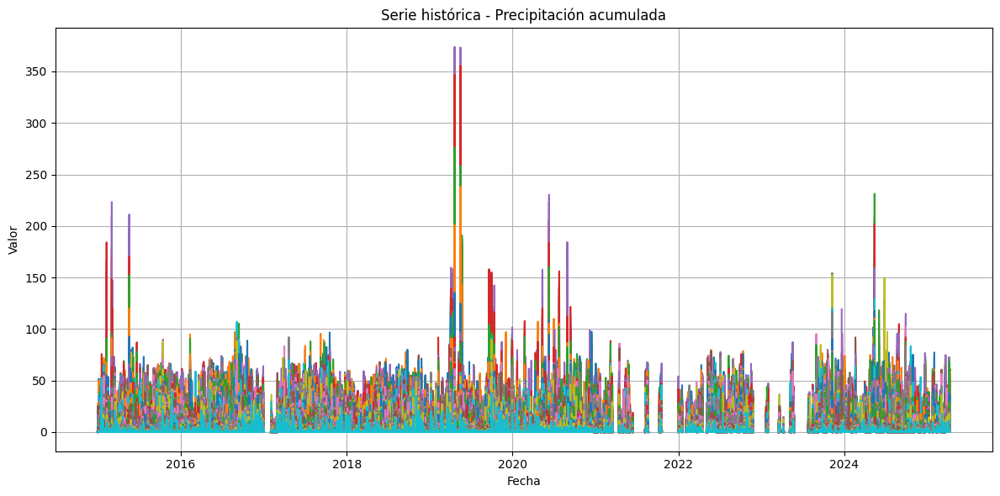

Reporte de datos NaN por columna:
lat_4.45_lon_-79.65    6392
lat_4.45_lon_-79.55    6392
lat_4.45_lon_-79.45    6392
lat_4.45_lon_-79.35    6392
lat_4.45_lon_-79.25    6392
                       ... 
lat_1.55_lon_-77.15    6392
lat_1.55_lon_-77.05    6392
lat_1.55_lon_-76.95    6392
lat_1.55_lon_-76.85    6392
lat_1.55_lon_-76.75    6392
Length: 900, dtype: int64


,lat_4.45_lon_-79.65,lat_4.45_lon_-79.55,lat_4.45_lon_-79.45,lat_4.45_lon_-79.35,lat_4.45_lon_-79.25,lat_4.45_lon_-79.15,lat_4.45_lon_-79.05,lat_4.45_lon_-78.95,lat_4.45_lon_-78.85,lat_4.45_lon_-78.75,...,lat_1.55_lon_-77.65,lat_1.55_lon_-77.55,lat_1.55_lon_-77.45,lat_1.55_lon_-77.35,lat_1.55_lon_-77.25,lat_1.55_lon_-77.15,lat_1.55_lon_-77.05,lat_1.55_lon_-76.95,lat_1.55_lon_-76.85,lat_1.55_lon_-76.75
2015-01-01 00:00:00,0.187500,0.125000,0.125000,0.062500,0.062500,0.062500,0.062500,0.062500,0.125000,0.125000,...,0.062500,0.062500,0.000000,0.000000,0.000000,0.062500,0.000000,0.000000,0.000000,0.000000e+00
2015-01-01 03:00:00,0.000000,0.000000,0.000000,0.062500,0.062500,0.062500,0.062500,0.062500,0.062500,0.062500,...,0.062500,0.062500,0.125000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00
2015-01-01 06:00:00,0.750000,0.250000,0.250000,0.250000,0.250000,0.250000,0.312500,0.312500,0.250000,0.250000,...,0.062500,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00
2015-01-01 09:00:00,0.875000,2.062500,0.750000,0.500000,0.500000,0.562500,0.562500,0.562500,0.562500,0.562500,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00
2015-01-01 12:00:00,0.312500,0.062500,0.062500,0.000000,0.125000,0.125000,0.062500,0.062500,0.125000,0.062500,...,0.000000,0.000000,0.187500,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-04-10 03:00:00,0.000005,0.000005,0.000003,0.000008,0.000003,0.000004,0.503665,0.489420,0.796617,0.764528,...,6.846832,3.517042,3.016545,2.890961,2.684013,2.490731,0.419302,0.509361,0.075881,6.464697e-02
2025-04-10 06:00:00,0.000002,0.045926,0.045625,0.737009,0.725790,0.735826,1.969025,1.956838,2.049899,1.958466,...,1.273124,1.433605,1.406342,1.768995,1.695058,1.602450,0.152694,0.198637,0.000002,7.399474e-06
2025-04-10 09:00:00,2.855390,3.819507,3.665368,3.473697,3.227715,3.066792,2.351255,2.126727,1.060263,1.025131,...,0.000005,0.000002,0.000006,0.051465,0.044355,0.041803,0.000004,0.000002,0.000002,7.447670e-07
2025-04-10 12:00:00,14.312798,12.351158,10.373526,7.099061,5.068276,5.431098,6.689415,6.839353,8.688954,9.756664,...,0.330349,0.534870,0.545340,0.468380,0.397376,0.371632,0.315593,0.385493,0.289943,2.444954e-01


In [3]:
import pandas as pd

# Cargar el CSV y parsear la columna de fecha como datetime
msweb_serie = pd.read_csv(
    r"E:\074-Diego Rengifo 2025\datasience\precipitacion\db\MSWEP-GloH2O\csv-3h\precipitacion igo radius(2.962, -78.173).csv",
    parse_dates=['dates'],   # reemplaza 'datetime' con el nombre real de tu columna de fecha
    index_col='dates'        # establecer la columna como índice
)


# --- Preprocesamiento: Agregacion temporal ---
if not msweb_serie.empty:
    msweb_serie.index= pd.to_datetime(msweb_serie.index)

    # Paso 2: Crear una serie con índice completo con frecuencia cada 3 horas
    start = msweb_serie.index.min()
    end = msweb_serie.index.max()
    full_index = pd.date_range(start=start, end=end, freq='3h')

    # Paso 3: Reindexar para insertar NaN donde faltan datos
    msweb_serie_with_nans = msweb_serie.reindex(full_index)
    
    # --- GRAFICAR ---
    plt.figure(figsize=(12, 6))
    plt.plot(msweb_serie_with_nans, label=msweb_serie.columns[0])
    plt.xlabel('Fecha')
    plt.ylabel('Valor')
    plt.title('Serie histórica - Precipitación acumulada')
    plt.grid(True)
    #plt.legend()
    plt.tight_layout()
    plt.show()

    # Reporte de NaNs
print('Reporte de datos NaN por columna:')
print(msweb_serie_with_nans.isnull().sum())
msweb_serie_with_nans



# Dataset

Se realiza la union de la informacion en un dataset, en este añadimos datos de la redmpomm y de la base de datos global, en las marcas de tiempo que coincidan, con el fin de unificar y procesar los datos de manera mas optima.


In [4]:
# Asegurarse de que el índice de todos los DataFrames sea datetime sin zona horaria
msweb_serie.index = pd.to_datetime(msweb_serie.index).tz_localize(None)
red_mpomm_serie_3h.index = pd.to_datetime(red_mpomm_serie_3h.index).tz_localize(None)

# Convertir la serie objetivo en DataFrame si no lo es
serie_red = red_mpomm_serie_3h[['value']].copy()

# Renombrar columnas de msweb_serie con un prefijo claro
msweb_renamed = msweb_serie.copy()
msweb_renamed.columns = [f'precipitation_{i+1}' for i in range(len(msweb_serie.columns))]

# Unir todo en un solo DataFrame usando concat (más eficiente que múltiples joins)
dataset = pd.concat([serie_red, msweb_renamed], axis=1)

# Reporte de NaNs
print('Reporte de datos NaN por columna:')
print(dataset.isnull().sum())

# Mostrar primeras filas
print(dataset.head())


Reporte de datos NaN por columna:
value                17647
precipitation_1      13722
precipitation_2      13722
precipitation_3      13722
precipitation_4      13722
                     ...  
precipitation_896    13722
precipitation_897    13722
precipitation_898    13722
precipitation_899    13722
precipitation_900    13722
Length: 901, dtype: int64
                     value  precipitation_1  precipitation_2  precipitation_3  \
2011-03-18 03:00:00    NaN              NaN              NaN              NaN   
2011-03-18 06:00:00    NaN              NaN              NaN              NaN   
2011-03-18 09:00:00    NaN              NaN              NaN              NaN   
2011-03-18 12:00:00    NaN              NaN              NaN              NaN   
2011-03-18 15:00:00    NaN              NaN              NaN              NaN   

                     precipitation_4  precipitation_5  precipitation_6  \
2011-03-18 03:00:00              NaN              NaN              NaN   
2011-03-

In [5]:
# Filtrar todas las columnas de precipitación (excluyendo la serie objetivo)
precip_cols = [col for col in dataset.columns if col.startswith('precipitation_')]

# Encontrar el primer índice donde al menos una columna de precipitación tiene un valor no nulo
non_null_mask = dataset[precip_cols].notnull().any(axis=1)
start_index = dataset[non_null_mask].index.min()
end_index = dataset.iloc[:, 0].last_valid_index()

# Filtrar el DataFrame desde ese índice en adelante
filtered_dataset = dataset.loc[start_index:end_index]

# Verificar resultado
print(f"Primer dato válido en al menos una columna de precipitación: {start_index}")
filtered_dataset


Primer dato válido en al menos una columna de precipitación: 2015-01-01 00:00:00


,value,precipitation_1,precipitation_2,precipitation_3,precipitation_4,precipitation_5,precipitation_6,precipitation_7,precipitation_8,precipitation_9,...,precipitation_891,precipitation_892,precipitation_893,precipitation_894,precipitation_895,precipitation_896,precipitation_897,precipitation_898,precipitation_899,precipitation_900
2015-01-01 00:00:00,0.0,0.187500,0.125000,0.125000,0.062500,0.062500,0.062500,0.062500,0.062500,0.125000,...,0.062500,0.062500,0.000000,0.000000,0.000000,0.062500,0.000000,0.000000,0.000000,0.000000
2015-01-01 03:00:00,0.0,0.000000,0.000000,0.000000,0.062500,0.062500,0.062500,0.062500,0.062500,0.062500,...,0.062500,0.062500,0.125000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2015-01-01 06:00:00,0.0,0.750000,0.250000,0.250000,0.250000,0.250000,0.250000,0.312500,0.312500,0.250000,...,0.062500,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2015-01-01 09:00:00,2.1,0.875000,2.062500,0.750000,0.500000,0.500000,0.562500,0.562500,0.562500,0.562500,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2015-01-01 12:00:00,2.6,0.312500,0.062500,0.062500,0.000000,0.125000,0.125000,0.062500,0.062500,0.125000,...,0.000000,0.000000,0.187500,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-03-04 15:00:00,0.0,0.000236,0.000891,0.000896,0.004363,0.004342,0.004363,0.009945,0.009850,0.016743,...,0.526628,0.994633,0.831301,1.357752,1.415917,1.276235,0.660804,0.762552,0.279441,0.194962
2022-03-04 18:00:00,0.0,0.000234,0.000682,0.000684,0.001366,0.001361,0.001360,0.005478,0.005439,0.019731,...,1.830046,2.586128,2.191118,2.843615,3.607137,3.864009,2.827395,3.220895,0.912490,0.639563
2022-03-04 21:00:00,0.0,0.000003,0.000445,0.000445,0.001367,0.001356,0.001357,0.001802,0.001791,0.000445,...,2.117804,3.413168,3.009036,6.467295,6.113944,5.661687,1.545979,1.776382,0.800813,0.643774
2022-03-05 00:00:00,0.0,0.003415,0.017918,0.011534,0.010674,0.010533,0.003622,0.001106,0.000676,0.001340,...,1.605005,1.156381,1.173702,2.946238,2.847559,2.683006,1.761665,1.879839,0.091738,0.092926


In [6]:
import pandas as pd
import numpy as np

# 1. Cargar tu DataFrame limpio y alineado en tiempo
df = filtered_dataset.copy()

# 2. Asegurarse de que 'date_time' es datetime y es el índice
df.index = pd.to_datetime(df.index)
df = df.sort_index()

# 3. Detectar valores faltantes en la serie objetivo
target_col = "value"
precip_cols = [col for col in df.columns if col.startswith('precipitation_')]


✅ Paso 1: Generación de features adicionales (⚡ clave para ML)

In [7]:
# Features temporales
df["hour"] = df.index.hour
df["month"] = df.index.month
df["dayofweek"] = df.index.dayofweek
df["dayofyear"] = df.index.dayofyear
df["is_weekend"] = df["dayofweek"].isin([5, 6]).astype(int)

# Media y varianza de vecinos
df["precip_mean"] = df[precip_cols].mean(axis=1)
df["precip_std"] = df[precip_cols].std(axis=1)
df["precip_max"] = df[precip_cols].max(axis=1)
df["precip_min"] = df[precip_cols].min(axis=1)

# Si llovió en estaciones vecinas
df["rain_neighbors"] = (df[precip_cols] > 0).sum(axis=1)

# Features finales para modelo
feature_cols = ["hour", "month", "dayofweek", "is_weekend",
                "precip_mean", "precip_std", "precip_max", "precip_min", "rain_neighbors"] + precip_cols


✅ Paso 2: Paso 1 del artículo → Modelo de Clasificación (llueve / no llueve)

In [8]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

# Crear variable binaria: 1 si value > 0, 0 si == 0, NaN si faltante
df["lluvia_binaria"] = df["value"].apply(
    lambda x: 1 if isinstance(x, (int, float)) and x > 0 else (0 if isinstance(x, (int, float)) and x == 0 else np.nan)
)

# Datos sin NaN para entrenar
df_train_class = df[df["lluvia_binaria"].notna()]
X_class = df_train_class[feature_cols]
y_class = df_train_class["lluvia_binaria"]

# Entrenar modelo de clasificación
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_class, y_class)


,n_estimators,100
,criterion,'gini'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,'sqrt'
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,bootstrap,True
,oob_score,False


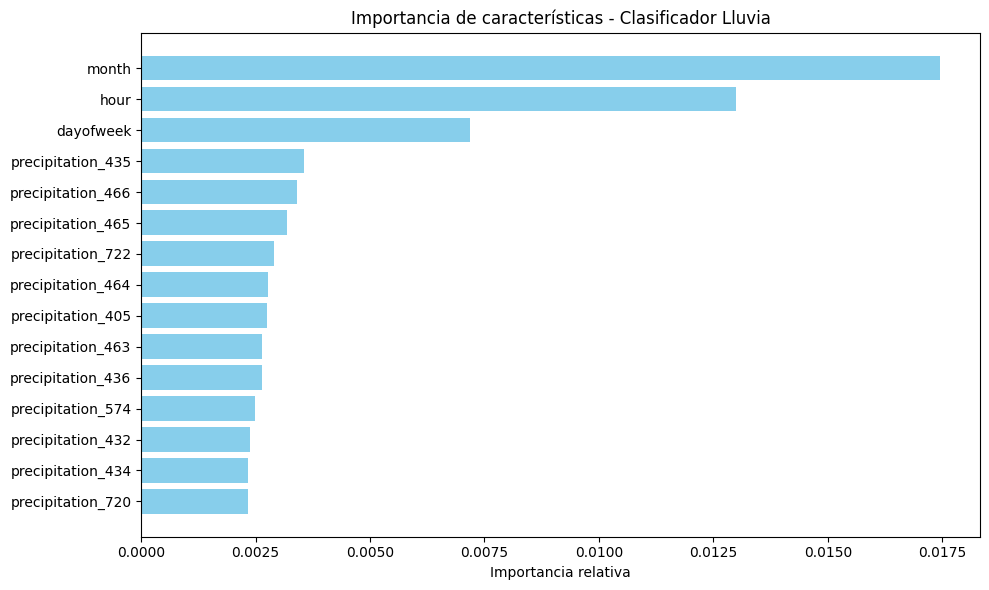

In [9]:
import numpy as np

importances = clf.feature_importances_
indices = np.argsort(importances)[-15:]  # Top 15 features
top_features = [X_class.columns[i] for i in indices]

plt.figure(figsize=(10, 6))
plt.barh(top_features, importances[indices], color='skyblue')
plt.title("Importancia de características - Clasificador Lluvia")
plt.xlabel("Importancia relativa")
plt.tight_layout()
plt.show()


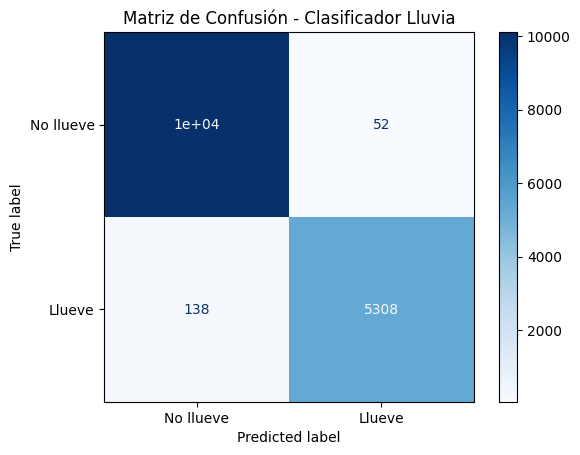

In [10]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Predecir sobre el conjunto de entrenamiento (o usar test split si prefieres)
y_pred = clf.predict(X_class)

# Matriz de confusión
cm = confusion_matrix(y_class, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No llueve", "Llueve"])
disp.plot(cmap="Blues")
plt.title("Matriz de Confusión - Clasificador Lluvia")
plt.show()


In [11]:
import matplotlib.pyplot as plt

# Generar predicciones
y_pred = clf.predict(X_class)

# Crear DataFrame para visualización
results_df = df_train_class.copy()
results_df['pred_lluvia'] = y_pred

# Mostrar una ventana temporal representativa (ej: 300 valores)
n = 300  # o selecciona un rango por fecha
sample_df = results_df.iloc[:n]


C:\Users\drengifo\AppData\Local\Temp\ipykernel_40212\92732421.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sample_df["error"] = sample_df["lluvia_binaria"] != sample_df["pred_lluvia"]


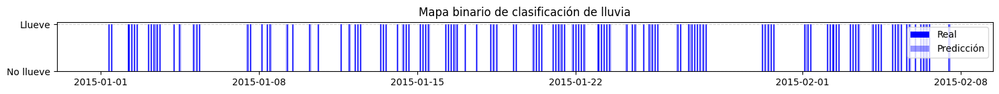

In [12]:
sample_df["error"] = sample_df["lluvia_binaria"] != sample_df["pred_lluvia"]
errores = sample_df[sample_df["error"]]
plt.figure(figsize=(15, 1.5))
plt.bar(sample_df.index, sample_df["lluvia_binaria"], width=0.03, color="blue", label="Real")
plt.bar(sample_df.index, sample_df["pred_lluvia"], width=0.1, color="blue", alpha=0.4, label="Predicción")
plt.title("Mapa binario de clasificación de lluvia")
plt.yticks([0, 1], ["No llueve", "Llueve"])
plt.grid(True, axis='y', linestyle='--', alpha=0.5)
plt.legend(loc="upper right")
plt.tight_layout()
plt.show()


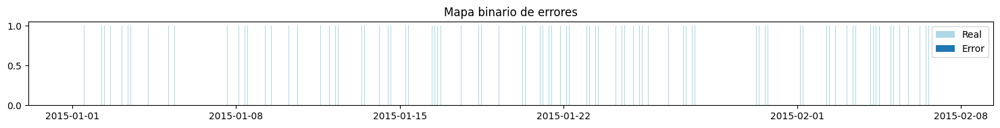

In [13]:
errores = sample_df["lluvia_binaria"] != sample_df["pred_lluvia"]

plt.figure(figsize=(15, 2))
plt.bar(sample_df.index, sample_df["lluvia_binaria"], color="lightblue", label="Real", width=0.02)
plt.bar(sample_df.index[errores], sample_df["pred_lluvia"][errores], color="red", label="Error", width=0.02)
plt.title("Mapa binario de errores")
plt.legend()
plt.tight_layout()
plt.show()


✅ Paso 3: Paso 2 del artículo → Modelo de Regresión (cuánto llovió si llovió)

In [14]:
from sklearn.ensemble import GradientBoostingRegressor

# Solo donde realmente llovió (value > 0)
df_train_reg = df[df["value"] > 0]
X_reg = df_train_reg[feature_cols]
y_reg = df_train_reg["value"]

# Entrenar modelo de regresión
reg = GradientBoostingRegressor(n_estimators=150, random_state=42)
valid_mask = X_reg.notna().all(axis=1)
X_reg_clean = X_reg[valid_mask]
y_reg_clean = y_reg[valid_mask]

reg.fit(X_reg_clean, y_reg_clean)



,loss,'squared_error'
,learning_rate,0.1
,n_estimators,150
,subsample,1.0
,criterion,'friedman_mse'
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_depth,3
,min_impurity_decrease,0.0
,init,None


In [16]:
df_missing = df[df["value"].isna()]
X_missing = df_missing[feature_cols]

# Predicción binaria: ¿llueve o no?
pred_lluvia = clf.predict(X_missing)

# Inicializar columna imputada
imputed_values = []

for i, idx in enumerate(X_missing.index):
    if pred_lluvia[i] == 0:
        imputed_values.append(0.0)
    else:
        x_input = X_missing.loc[[idx]].dropna()  # mantiene los nombres de columnas
        imputed_values.append(reg.predict(x_input)[0])

# Asignar a DataFrame original
df.loc[X_missing.index, "value"] = imputed_values


ValueError: Found array with 0 sample(s) (shape=(0, 909)) while a minimum of 1 is required by GradientBoostingRegressor.

# Grafica

In [ ]:
df

,value,precipitation_1,precipitation_2,precipitation_3,precipitation_4,precipitation_5,precipitation_6,precipitation_7,precipitation_8,precipitation_9,...,month,dayofweek,dayofyear,is_weekend,precip_mean,precip_std,precip_max,precip_min,rain_neighbors,lluvia_binaria
2015-01-01 00:00:00,0.0,0.187500,0.125000,0.125000,0.062500,0.062500,0.062500,0.062500,0.062500,0.125000,...,1,3,1,0,0.340417,0.449509,3.937500,0.000000,813,0.0
2015-01-01 03:00:00,0.0,0.000000,0.000000,0.000000,0.062500,0.062500,0.062500,0.062500,0.062500,0.062500,...,1,3,1,0,0.506597,0.632481,7.312500,0.000000,811,0.0
2015-01-01 06:00:00,0.0,0.750000,0.250000,0.250000,0.250000,0.250000,0.250000,0.312500,0.312500,0.250000,...,1,3,1,0,0.450000,0.670688,7.562500,0.000000,756,0.0
2015-01-01 09:00:00,2.1,0.875000,2.062500,0.750000,0.500000,0.500000,0.562500,0.562500,0.562500,0.562500,...,1,3,1,0,0.490694,1.125772,15.250000,0.000000,708,1.0
2015-01-01 12:00:00,2.6,0.312500,0.062500,0.062500,0.000000,0.125000,0.125000,0.062500,0.062500,0.125000,...,1,3,1,0,0.428958,0.469368,4.062500,0.000000,729,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-03-04 15:00:00,0.0,0.000236,0.000891,0.000896,0.004363,0.004342,0.004363,0.009945,0.009850,0.016743,...,3,4,63,0,0.507712,0.691223,4.399594,0.000004,900,0.0
2022-03-04 18:00:00,0.0,0.000234,0.000682,0.000684,0.001366,0.001361,0.001360,0.005478,0.005439,0.019731,...,3,4,63,0,0.932897,1.235520,6.635685,0.000232,900,0.0
2022-03-04 21:00:00,0.0,0.000003,0.000445,0.000445,0.001367,0.001356,0.001357,0.001802,0.001791,0.000445,...,3,4,63,0,1.460237,2.032781,9.142740,0.000003,900,0.0
2022-03-05 00:00:00,0.0,0.003415,0.017918,0.011534,0.010674,0.010533,0.003622,0.001106,0.000676,0.001340,...,3,5,64,1,1.766328,2.524369,16.482939,0.000002,900,0.0


In [ ]:
import plotly.express as px
import pandas as pd

# Crear DataFrame combinado para graficar
df_plot = pd.DataFrame({
    "Fecha": df.index,
    "Imputado": df["value"],
    "Original (con NaN)": filtered_dataset["value"]
})

fig = px.line(
    df_plot,
    x="Fecha",
    y=["Original (con NaN)", "Imputado"],
    labels={"value": "Precipitación (mm)"},
    title="Comparación de serie original vs. imputada"
)

fig.update_layout(template="plotly_white")
fig.show()


## Forecast

🔹 Paso 1: Ingeniería de features y lags

In [ ]:
import pandas as pd
import numpy as np

# Asegúrate de tener el índice como DatetimeIndex
df = df.copy()
df.index = pd.to_datetime(df.index)

# ----------- Características temporales ---------------------
df["hour"] = df.index.hour                    # hora del día (0-23)
df["month"] = df.index.month                  # mes (1-12)
df["dayofweek"] = df.index.dayofweek          # día de la semana (0=lunes)
df["dayofyear"] = df.index.dayofyear          # día del año
df["is_weekend"] = df["dayofweek"] >= 5       # indicador de fin de semana
df["season"] = ((df["month"]%12 + 3)//3)      # estación (1=invierno, 2=primavera...)

# ----------- Características de vecinos temporales (lags) --------
n_lags = 9  # 9 vecinos anteriores: 27 horas hacia atrás
for i in range(1, n_lags + 1):
    df[f"precipitation_{i}"] = df["value"].shift(i)

# ----------- Estadísticas móviles (3 días ~ 24 datos en serie 3h) -----------
df["precip_mean"] = df["value"].rolling(window=8, min_periods=1).mean()
df["precip_std"] = df["value"].rolling(window=8, min_periods=1).std()
df["precip_max"] = df["value"].rolling(window=8, min_periods=1).max()
df["precip_min"] = df["value"].rolling(window=8, min_periods=1).min()

# ----------- Lluvia binaria y acumulada ------------
df["lluvia_binaria"] = (df["value"] > 0).astype(float)
df["rain_neighbors"] = df["lluvia_binaria"].rolling(window=9, min_periods=1).sum()

# ----------- Limpieza final ----------
df.dropna(inplace=True)

# Features para el modelo
feature_cols = [
    "hour", "month", "dayofweek", "dayofyear", "is_weekend", "season",
    *[f"precipitation_{i}" for i in range(1, n_lags + 1)],
    "precip_mean", "precip_std", "precip_max", "precip_min",
    "rain_neighbors", "lluvia_binaria"
]

X = df[feature_cols]
y = df["value"]


🔹 Paso 2: Entrenamiento del modelo autoregresivo

In [ ]:
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# División de datos
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

# Entrenamiento
xgb_model = XGBRegressor(
    n_estimators=300,
    max_depth=6,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
    n_jobs=-1
)

xgb_model.fit(X_train, y_train)

# Predicción y evaluación
y_pred = xgb_model.predict(X_test)
rmse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"RMSE: {rmse:.3f}")
print(f"R² Score: {r2:.3f}")


RMSE: 0.155
R² Score: 0.906


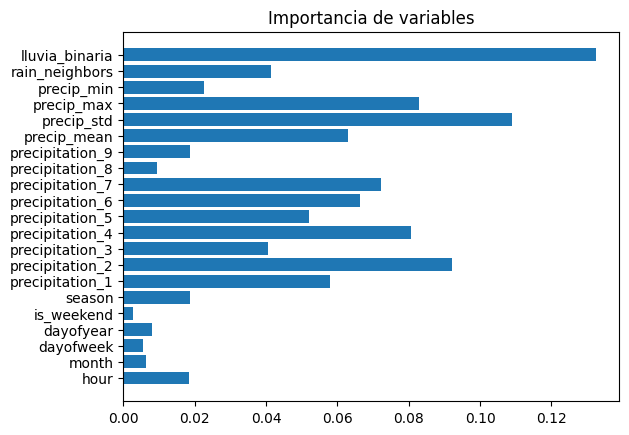

In [ ]:
import matplotlib.pyplot as plt
importances = xgb_model.feature_importances_
plt.barh(feature_cols, importances)
plt.title("Importancia de variables")
plt.show()


🔹 Paso 3: Forecast autoregresivo recursivo para 2024

In [ ]:
# Generar lags como features (ej. 3 lags)
for lag in range(1, 4):
    df[f"value_lag_{lag}"] = df["value"].shift(lag)

# Quitar NaN iniciales por los lags
df_model = df.dropna()

X_train = df_model.drop(columns=["value"])
y_train = df_model["value"]

# Entrenar
from xgboost import XGBRegressor
model = XGBRegressor(n_estimators=100, random_state=42, n_jobs=-1)
model.fit(X_train, y_train)


,objective,'reg:squarederror'
,base_score,None
,booster,None
,callbacks,None
,colsample_bylevel,None
,colsample_bynode,None
,colsample_bytree,None
,device,None
,early_stopping_rounds,None
,enable_categorical,False
,eval_metric,None


📊 Paso 4: Visualización

In [ ]:
import pandas as pd
from pandas.tseries.offsets import Hour

# Obtener nombres de features que espera el modelo
model_features = model.get_booster().feature_names

# Crear fechas de predicción para todo el 2023 (cada 3 horas)
pred_dates = pd.date_range("2023-01-01 00:00:00", "2023-12-31 21:00:00", freq="3h")
forecast_df = pd.DataFrame(index=pred_dates)

# Inicializar el buffer de lags con datos históricos hasta 2022 (reales o imputados)
lag_buffer = df["value"].loc[:'2022-12-31'].fillna(method='ffill').fillna(method='bfill').tail(900).tolist()

# Iterar sobre cada fecha de predicción
for date in pred_dates:
    row = {}

    # Agregar 900 valores de lags
    for i in range(1, 901):
        row[f"precipitation_{i}"] = lag_buffer[-i] if i <= len(lag_buffer) else 0

    # Agregar características temporales conocidas
    row.update({
        "hour": date.hour,
        "month": date.month,
        "day": date.day,
        "dayofweek": date.dayofweek,
        "dayofyear": date.dayofyear,
        "is_weekend": int(date.dayofweek >= 5),
    })

    # Crear DataFrame con las mismas columnas que usó el modelo
    X_pred = pd.DataFrame([row], columns=model_features)

    # Hacer la predicción y actualizar el forecast y el lag_buffer
    y_pred = model.predict(X_pred)[0]
    forecast_df.loc[date, "forecast"] = y_pred
    lag_buffer.append(y_pred)


C:\Users\drengifo\AppData\Local\Temp\ipykernel_56192\1913229452.py:12: FutureWarning:

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



In [ ]:
lag_buffer

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.1,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.1,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.1,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0

In [ ]:
feature_2023 = dataset[dataset.index.year == 2023]


In [ ]:
import plotly.graph_objects as go

# Crear figura
fig = go.Figure()

# Datos históricos (últimos 90 días)
fig.add_trace(go.Scatter(
    x=df.index[-90:],
    y=df['value'].iloc[-90:],
    mode='lines',
    name='Datos históricos (2023)',
    line=dict(color='blue')
))

# Pronóstico 2024
fig.add_trace(go.Scatter(
    x=forecast_df.index,
    y=forecast_df['forecast'],
    mode='lines',
    name='Pronóstico (2024)',
    line=dict(color='red')
))

# Personalización
fig.update_layout(
    title='Pronóstico de Precipitación 2024 vs Datos Históricos',
    xaxis_title='Fecha',
    yaxis_title='Precipitación (mm)',
    legend=dict(x=0, y=1),
    template='plotly_white',
    hovermode='x unified',
    width=1000,
    height=500
)

# Mostrar gráfica
fig.show()


In [ ]:
plt.fill_between(
    forecast_df.index,
    forecast_df['forecast_lower'],  # Límite inferior
    forecast_df['forecast_upper'],  # Límite superior
    color='red',
    alpha=0.2,
    label='Intervalo de confianza (95%)'
)

KeyError: 'forecast_lower'

In [ ]:
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import RobustScaler
import pandas as pd
import joblib
import numpy as np

# ----------------------------
# 1. Definir el pipeline
# ----------------------------

pipeline = Pipeline([
    ('scaler', RobustScaler()),  # XGBoost se beneficia del escalado
    ('xgb', XGBRegressor(random_state=42, n_jobs=1, objective='reg:squarederror'))
])

# ----------------------------
# 2. Definir la grilla de hiperparámetros
# ----------------------------

param_grid = {
    'xgb__n_estimators': [100, 200, 300],
    'xgb__max_depth': [3, 6, 9],
    'xgb__learning_rate': [0.01, 0.05, 0.1],
    'xgb__subsample': [0.8, 1.0],
    'xgb__colsample_bytree': [0.8, 1.0],
    'xgb__gamma': [0, 0.1, 0.2]
}

# ----------------------------
# 3. Validación cruzada y GridSearchCV
# ----------------------------

cv = TimeSeriesSplit(n_splits=5)
scoring = {'R2': 'r2', 'MAE': 'neg_mean_absolute_error', 'MSE': 'neg_mean_squared_error'}

# Configuración de GridSearchCV
grid_search = GridSearchCV(
    estimator=pipeline,
    param_grid=param_grid,
    scoring=scoring,
    refit='R2',
    cv=cv,
    n_jobs=1,  # XGBoost ya usa paralelismo interno (n_jobs=-1 en el estimador)
    verbose=2,
    return_train_score=True
)

# ----------------------------
# 4. Ajustar modelo
# ----------------------------

grid_search.fit(xTrain, yTrain)

# ----------------------------
# 5. Resultados
# ----------------------------

print("\n✅ Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

# Extraer el mejor modelo y sus pasos
best_pipeline = grid_search.best_estimator_
best_xgb = best_pipeline.named_steps['xgb']

# Mejor score R2 validación cruzada
print(f"\n🔍 Mejor score R² en validación cruzada: {grid_search.best_score_:.4f}")


NameError: name 'xTrain' is not defined

In [ ]:

# ----------------------------
# 6. Métricas de entrenamiento desde cv_results_
# ----------------------------
results = pd.DataFrame(grid_search.cv_results_)
best_idx = grid_search.best_index_

# Buscar automáticamente las columnas de métricas
mean_test_col = [col for col in results.columns if 'mean_test_R2' in col][0]
std_test_col = [col for col in results.columns if 'std_test_R2' in col][0]

top = results.sort_values(by=mean_test_col, ascending=False)
print("\n📊 Top combinaciones:")
print(top[[mean_test_col, std_test_col, 'params']].head(5))

train_rmse = np.sqrt(-results.loc[best_idx, 'mean_train_MSE'])
train_mae = -results.loc[best_idx, 'mean_train_MAE']
train_r2 = results.loc[best_idx, 'mean_train_R2']

print(f"\n📊 Métricas en entrenamiento (modelo final):")
print(f"• RMSE entrenamiento: {train_rmse:.4f}")
print(f"• MAE  entrenamiento: {train_mae:.4f}")
print(f"• R²   entrenamiento: {train_r2:.4f}")



📊 Top combinaciones:
     mean_test_R2  std_test_R2  \
12       0.159348     0.027035   
120      0.158851     0.026397   
66       0.158713     0.026910   
114      0.156408     0.027497   
6        0.156361     0.027602   

                                                params  
12   {'xgb__colsample_bytree': 0.8, 'xgb__gamma': 0...  
120  {'xgb__colsample_bytree': 0.8, 'xgb__gamma': 0...  
66   {'xgb__colsample_bytree': 0.8, 'xgb__gamma': 0...  
114  {'xgb__colsample_bytree': 0.8, 'xgb__gamma': 0...  
6    {'xgb__colsample_bytree': 0.8, 'xgb__gamma': 0...  

📊 Métricas en entrenamiento (modelo final):
• RMSE entrenamiento: 2.6446
• MAE  entrenamiento: 0.9036
• R²   entrenamiento: 0.6411


In [ ]:

# ----------------------------
# 7. Top combinaciones por R²
# ----------------------------
top = results.sort_values(by='mean_test_R2', ascending=False)
print("\n📈 Top 5 combinaciones:")
print(top[['mean_test_R2', 'std_test_R2', 'params']].head(5))



📈 Top 5 combinaciones:
     mean_test_R2  std_test_R2  \
12       0.159348     0.027035   
120      0.158851     0.026397   
66       0.158713     0.026910   
114      0.156408     0.027497   
6        0.156361     0.027602   

                                                params  
12   {'xgb__colsample_bytree': 0.8, 'xgb__gamma': 0...  
120  {'xgb__colsample_bytree': 0.8, 'xgb__gamma': 0...  
66   {'xgb__colsample_bytree': 0.8, 'xgb__gamma': 0...  
114  {'xgb__colsample_bytree': 0.8, 'xgb__gamma': 0...  
6    {'xgb__colsample_bytree': 0.8, 'xgb__gamma': 0...  


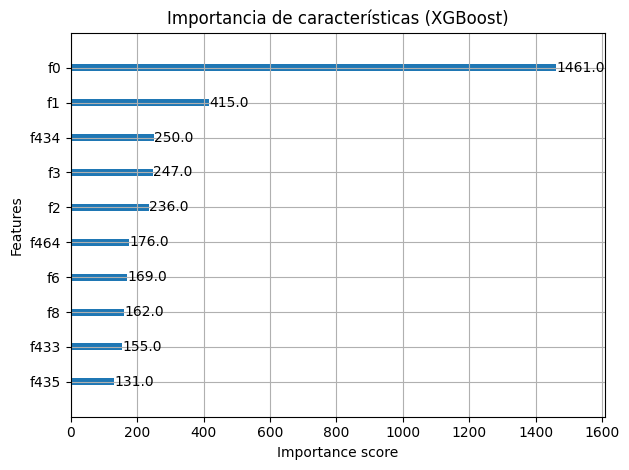

In [ ]:
# ----------------------------
# 8. Guardar el mejor modelo
# ----------------------------
from xgboost import plot_importance

joblib.dump(best_pipeline, 'best_xgb_model_pipeline.pkl')

# ----------------------------
# 9. Visualizar importancia de características
# ----------------------------
plot_importance(best_xgb, max_num_features=10)
plt.title("Importancia de características (XGBoost)")
plt.tight_layout()
plt.show()

Calculando RMSE en entrenamiento: 100%|██████████| 10/10 [00:00<00:00, 13.29it/s]


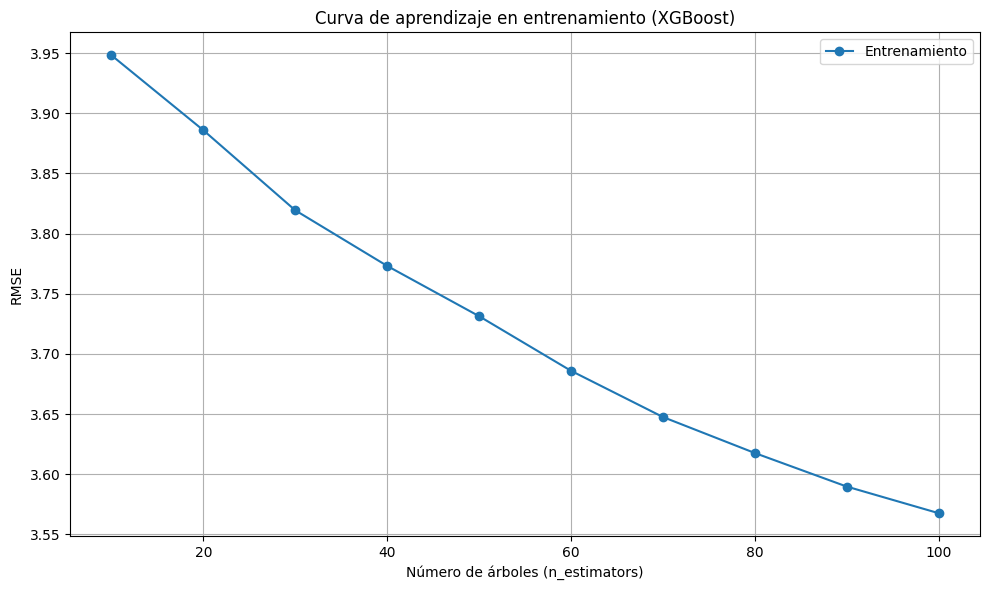

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
from tqdm import tqdm

# Validar cuántos árboles realmente entrenó
n_estimators_total = getattr(best_xgb, 'best_ntree_limit', best_xgb.n_estimators)

# Lista de valores para probar progresivamente
n_estimators_list = list(range(10, n_estimators_total + 1, 10))

# Inicializar lista de errores
train_scores = []
#print(f"🌲 Mejor número de árboles (según early stopping): {best_xgb.best_iteration}")

# Calcular RMSE en entrenamiento para cada número de árboles
for n in tqdm(n_estimators_list, desc="Calculando RMSE en entrenamiento"):
    y_train_pred = best_xgb.predict(xTrain, iteration_range=(0, n))
    train_rmse = np.sqrt(mean_squared_error(yTrain, y_train_pred))
    train_scores.append(train_rmse)

# Graficar la curva de error en entrenamiento
plt.figure(figsize=(10, 6))
plt.plot(n_estimators_list, train_scores, label='Entrenamiento', marker='o')
plt.title("Curva de aprendizaje en entrenamiento (XGBoost)")
plt.xlabel("Número de árboles (n_estimators)")
plt.ylabel("RMSE")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
from sklearn.metrics import mean_squared_error

# Calcular RMSE en diferentes puntos del entrenamiento
train_scores = []
val_scores = []
n_estimators_list = range(10, best_xgb.n_estimators + 1, 10)

for n in n_estimators_list:
    # Predecir con el número actual de estimadores
    y_train_pred = best_xgb.predict(xTrain, iteration_range=(0, n))
    y_val_pred = best_xgb.predict(xVal, iteration_range=(0, n))
    
    # Calcular RMSE
    train_rmse = np.sqrt(mean_squared_error(yTrain, y_train_pred))
    val_rmse = np.sqrt(mean_squared_error(yVal, y_val_pred))
    
    train_scores.append(train_rmse)
    val_scores.append(val_rmse)

# Graficar los resultados
plt.figure(figsize=(10, 6))
plt.plot(n_estimators_list, train_scores, label='Entrenamiento')
plt.plot(n_estimators_list, val_scores, label='Validación')
plt.title("Curva de aprendizaje reconstruida")
plt.xlabel("Número de árboles (n_estimators)")
plt.ylabel("RMSE")
plt.legend()
plt.grid(True)
plt.show()

NameError: name 'xVal' is not defined

In [ ]:
# Entrenar capturando el historial
history = best_xgb.fit(
    xTrain, yTrain,
    eval_set=[(xTrain, yTrain), (X_val, y_val)],
    eval_metric="rmse",
    verbose=0  # Cambiar a 10 para ver progreso durante entrenamiento
)

# Graficar
plt.figure(figsize=(10, 6))
plt.plot(history.evals_result()['validation_0']['rmse'], label='Entrenamiento')
plt.plot(history.evals_result()['validation_1']['rmse'], label='Validación')
plt.title("Evolución del RMSE durante el entrenamiento")
plt.xlabel("Iteraciones")
plt.ylabel("RMSE")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

In [ ]:
from sklearn.model_selection import cross_val_score
import numpy as np

# Asumiendo que:
# - best_rf es tu RandomForestRegressor ya entrenado
# - X_train son tus características sin escalar (datos originales)
# - yTrain son tus valores objetivo

# Validación cruzada sin escalado
scores = cross_val_score(
    best_xgb, 
    xTrain,  # Usamos los datos originales sin escalar
    yTrain, 
    scoring='neg_mean_squared_error', 
    cv=5
)

print("Cross-validation MSE scores:", -scores)
print("Cross-validation MSE promedio:", -scores.mean())
print("Desviación estándar:", np.std(-scores))

Cross-validation MSE scores: [17.91156132 12.70875601  9.78676416 16.03449784  9.53974046]
Cross-validation MSE promedio: 13.196263957033029
Desviación estándar: 3.3323300472370563


- Guardar y reutilizar el modelo (opcional)

In [ ]:
'''import joblib

# Guardar modelo
joblib.dump(regr, 'mlp_model.pkl')
joblib.dump(scaler, 'scaler.pkl')

# Cargar luego
# regr = joblib.load('mlp_model.pkl')
'''

"import joblib\n\n# Guardar modelo\njoblib.dump(regr, 'mlp_model.pkl')\njoblib.dump(scaler, 'scaler.pkl')\n\n# Cargar luego\n# regr = joblib.load('mlp_model.pkl')\n"

In [ ]:
# --- Predicción usando el pipeline completo ---
yPredict = best_pipeline.predict(xTrain)  # Usa el pipeline completo (escalado + modelo)
print(yPredict[:10])

# Si necesitas las predicciones en la escala original (si el target fue escalado)
# Nota: En tu pipeline actual solo se escala X, no y, así que no hay necesidad de invertir la escala

[0.3322069  0.37109298 0.70378804 2.460716   1.5464901  0.568442
 0.35715738 0.34273437 0.37859362 0.55963016]


C:\Users\drengifo\AppData\Local\Temp\ipykernel_19880\1971845686.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_iqr_dataset['imputados_xgb'] = np.nan  # Usamos un nombre diferente para distinguir


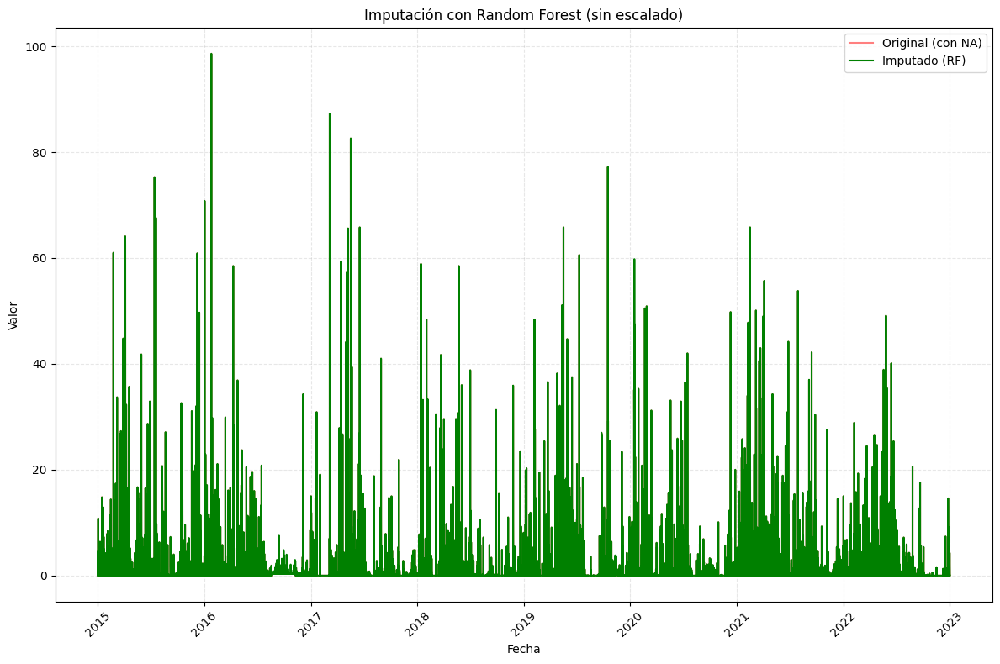


=== Resumen Estadístico ===
Total de registros: 23378
Valores originales disponibles: 22514
Valores imputados: 862
% de imputación: 3.69%

Comparación de distribuciones:
              value  imputados_xgb
count  22514.000000   23376.000000
mean       0.807720       0.803328
std        3.926193       3.856497
min        0.000000       0.000000
25%        0.000000       0.000000
50%        0.000000       0.000000
75%        0.000000       0.100000
max       98.600000      98.600000


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

## 1. Crear columna para valores imputados
filtered_iqr_dataset['imputados_xgb'] = np.nan  # Usamos un nombre diferente para distinguir

## 2. Identificar valores faltantes a imputar
missing_mask = (
    filtered_iqr_dataset['value'].isna() & 
    filtered_iqr_dataset[columns_for_model].notna().all(axis=1)
)

## 3. Obtener datos para imputación (sin escalar)
to_impute = filtered_iqr_dataset.loc[missing_mask, columns_for_model]

## 4. Predecir con Random Forest (sin escalado)
predicted_values = best_xgb.predict(to_impute)

## 5. Asegurar valores positivos si es necesario
predicted_values = np.maximum(predicted_values, 0)  # Más eficiente que np.where

## 6. Asignar valores imputados
filtered_iqr_dataset.loc[missing_mask, 'imputados_xgb'] = predicted_values

## 7. Conservar valores originales
filtered_iqr_dataset.loc[filtered_iqr_dataset['value'].notna(), 'imputados_xgb'] = \
    filtered_iqr_dataset['value']

## 8. Visualización comparativa
plt.figure(figsize=(12, 8))

# Serie original (con huecos)
plt.plot(filtered_iqr_dataset.index, filtered_iqr_dataset['value'], 
          color='red', alpha=0.5, label='Original (con NA)', markersize=3)

# Serie imputada
plt.plot(filtered_iqr_dataset.index, filtered_iqr_dataset['imputados_xgb'], 
          color='green', linewidth=1.5, label='Imputado (RF)')

'''# Destacar puntos imputados
imputed_points = filtered_iqr_dataset[missing_mask]
plt.scatter(imputed_points.index, imputed_points['imputados_xgb'], 
            color='lime', edgecolor='darkgreen', label='Puntos imputados', zorder=5)'''

plt.title('Imputación con Random Forest (sin escalado)')
plt.xlabel('Fecha')
plt.ylabel('Valor')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.3)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## 9. Análisis de resultados
print("\n=== Resumen Estadístico ===")
print(f"Total de registros: {len(filtered_iqr_dataset)}")
print(f"Valores originales disponibles: {filtered_iqr_dataset['value'].count()}")
print(f"Valores imputados: {missing_mask.sum()}")
print(f"% de imputación: {missing_mask.sum()/len(filtered_iqr_dataset)*100:.2f}%")

# Estadísticas descriptivas
print("\nComparación de distribuciones:")
print(filtered_iqr_dataset[['value', 'imputados_xgb']].describe())

In [ ]:
# Reporte de NaNs
print('Reporte de datos NaN por columna:')
print(filtered_iqr_dataset.isnull().sum())


Reporte de datos NaN por columna:
value                 864
precipitation_1      3504
precipitation_2      3504
precipitation_3      3504
precipitation_4      3504
                     ... 
precipitation_897    3504
precipitation_898    3504
precipitation_899    3504
precipitation_900    3504
imputados_xgb           2
Length: 902, dtype: int64


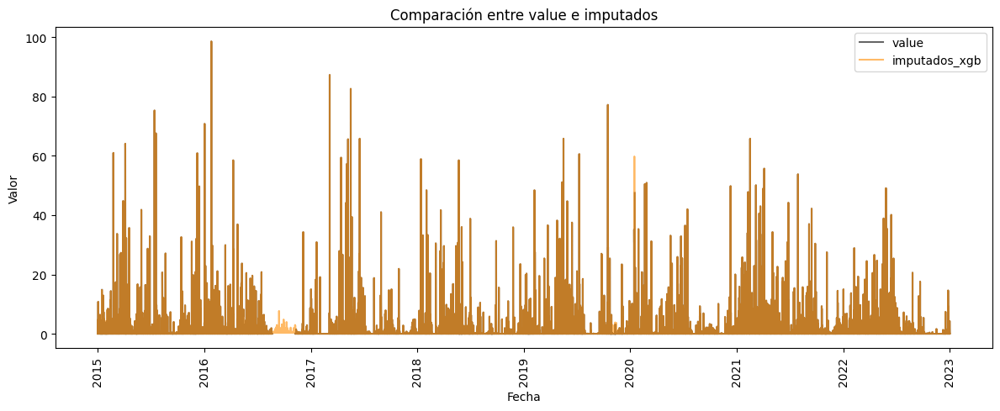

In [ ]:
# Mostrar solo 'value' e 'imputados' con transparencia
plt.figure(figsize=(12, 5))
plt.plot(filtered_iqr_dataset.index, filtered_iqr_dataset['value'], label='value', color='black', alpha=0.6)
plt.plot(filtered_iqr_dataset.index, filtered_iqr_dataset['imputados_xgb'], label='imputados_xgb', color='darkorange', alpha=0.6)
plt.legend()
plt.xticks(rotation='vertical')
plt.title('Comparación entre value e imputados')
plt.xlabel('Fecha')
plt.ylabel('Valor')
plt.tight_layout()
plt.show()


In [ ]:
from graphics_utils.go import multi_line

fig=multi_line(original=filtered_iqr_dataset['value'], imputada=filtered_iqr_dataset['imputados_xgb'])
fig.show()

# validacion de pronostico 2023

In [ ]:
# Tu serie temporal original (para obtener últimos valores)
msweb_serie.index = pd.to_datetime(msweb_serie.index)
msweb_serie = msweb_serie.asfreq('3h')
# ------------------------------------------------------------
# 4. FORECAST RECURSIVO CORREGIDO
# ------------------------------------------------------------

def recursive_forecast(model, last_known_values, n_periods, feature_names):
    """
    Función mejorada para forecast recursivo que maneja correctamente:
    - Estructura de datos de entrada
    - Nombres de características
    - Formato de arrays
    """
    predictions = []
    current_window = last_known_values.copy()
    n_lags = len(feature_names)
    
    for _ in range(n_periods):
        try:
            # Crear array 2D con la estructura correcta
            input_data = np.array([current_window[-n_lags:]]).reshape(1, -1)
            
            # Convertir a DataFrame con los nombres correctos
            input_df = pd.DataFrame(input_data, columns=feature_names)
            
            # Predecir
            pred = model.predict(input_df)[0]
            predictions.append(float(pred))  # Asegurar valor escalar
            current_window.append(float(pred))
            
        except Exception as e:
            print(f"Error en predicción: {str(e)}")
            predictions.append(np.nan)
            current_window.append(np.nan)
    
    return predictions

# ------------------------------------------------------------
# Configuración del Forecast
# ------------------------------------------------------------

# 1. Obtener nombres de características del modelo entrenado
feature_names = xTrain.columns.tolist()
n_lags = len(feature_names)

# 2. Obtener últimos valores conocidos (asegurar que son float)
last_known = msweb_serie.dropna().values[-n_lags:].astype(float).tolist()

# 3. Configurar período de forecast (2024, frecuencia 3H)
n_periods_2024 = 8 * 365  # 8 puntos por día * 365 días
forecast_dates = pd.date_range(start='2024-01-01', periods=n_periods_2024, freq='3h')

# 4. Obtener el mejor modelo del GridSearch
best_pipeline = grid_search.best_estimator_

# 5. Ejecutar forecast
forecast_values = recursive_forecast(
    model=best_pipeline,
    last_known_values=last_known,
    n_periods=n_periods_2024,
    feature_names=feature_names
)

# 6. Crear serie con resultados
forecast_2024 = pd.Series(
    data=forecast_values,
    index=forecast_dates,
    name='forecast'
)

# ------------------------------------------------------------
# Verificación y Exportación
# ------------------------------------------------------------

# Verificar primeros valores
print("Primeras predicciones:")
print(forecast_2024.head())

# Exportar resultados
forecast_2024.to_csv('forecast_2024_corregido.csv')

Error en predicción: Shape of passed values is (1, 810000), indices imply (1, 900)
Error en predicción: setting an array element with a sequence. The requested array has an inhomogeneous shape after 2 dimensions. The detected shape was (1, 900) + inhomogeneous part.
Error en predicción: setting an array element with a sequence. The requested array has an inhomogeneous shape after 2 dimensions. The detected shape was (1, 900) + inhomogeneous part.
Error en predicción: setting an array element with a sequence. The requested array has an inhomogeneous shape after 2 dimensions. The detected shape was (1, 900) + inhomogeneous part.
Error en predicción: setting an array element with a sequence. The requested array has an inhomogeneous shape after 2 dimensions. The detected shape was (1, 900) + inhomogeneous part.
Error en predicción: setting an array element with a sequence. The requested array has an inhomogeneous shape after 2 dimensions. The detected shape was (1, 900) + inhomogeneous par

In [ ]:
#Generar fechas para forecast (2024, frecuencia 3H)
n_periods_2024 = int((365 * 24) / 3)
forecast_dates = pd.date_range(start='2024-01-01', periods=n_periods_2024, freq='3h')

# Hacer forecast
forecast_values = recursive_forecast(
    model=grid_search.best_estimator_,
    last_known_values=last_known,
    n_periods=n_periods_2024,
    n_lags=n_lags
)

# Crear serie con resultados
forecast_2024 = pd.Series(
    data=forecast_values,
    index=forecast_dates,
    name='forecast'
)

ValueError: The feature names should match those that were passed during fit.
Feature names unseen at fit time:
- lag_1
- lag_10
- lag_100
- lag_101
- lag_102
- ...
Feature names seen at fit time, yet now missing:
- precipitation_1
- precipitation_10
- precipitation_100
- precipitation_101
- precipitation_102
- ...


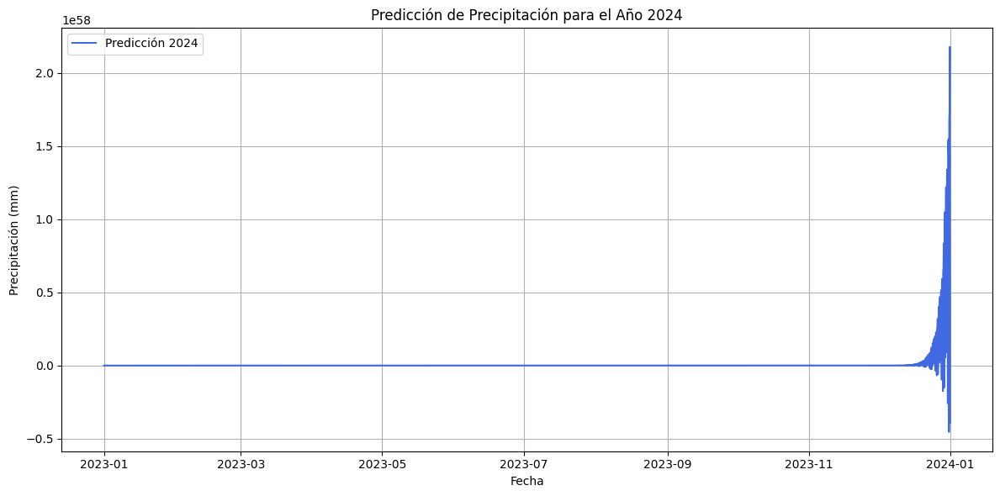

In [ ]:
pred_2024 = pd.DataFrame({'Predicción': predicciones}, index=fechas_2024)
pred_2024.index = pd.to_datetime(pred_2024.index)

# Crear gráfico
plt.figure(figsize=(12, 6))
plt.plot(pred_2024.index, pred_2024['Predicción'], label='Predicción 2024', color='royalblue')

# Formato del gráfico
plt.title('Predicción de Precipitación para el Año 2024')
plt.xlabel('Fecha')
plt.ylabel('Precipitación (mm)')
plt.grid(True)
plt.legend()
plt.tight_layout()

# Mostrar gráfico
plt.show()



¿Valores nulos restantes? 0


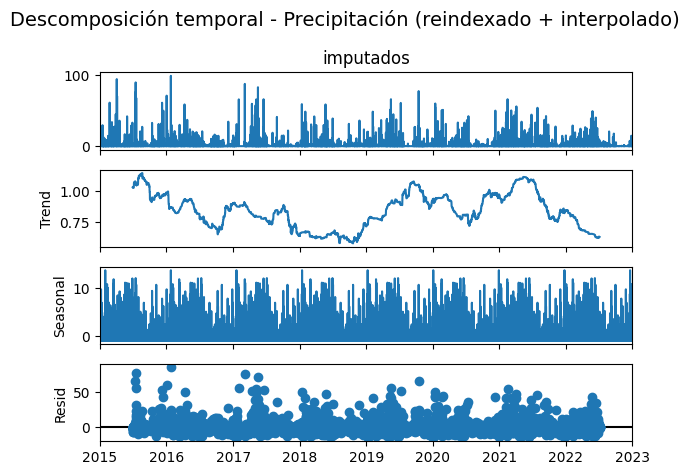

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt

# 1. Selecciona la columna
precip_clean = filtered_iqr_dataset['imputados'].copy()

# 2. Convierte el índice a datetime si no lo es
precip_clean.index = pd.to_datetime(precip_clean.index)

# 3. Reindexar con frecuencia completa para evitar huecos ocultos
full_index = pd.date_range(start=precip_clean.index.min(), end=precip_clean.index.max(), freq='3h')
precip_clean = precip_clean.reindex(full_index)

# 4. Interpola para evitar NaNs
precip_clean = precip_clean.interpolate(method='linear')

# 5. Confirmar limpieza
print("¿Valores nulos restantes?", precip_clean.isna().sum())

# 6. Descomposición (usamos period=8 para ciclo diario en datos 3H)
decomposition = seasonal_decompose(precip_clean, model='additive', period=8*30*12)
decomposition.plot()
plt.suptitle("Descomposición temporal - Precipitación (reindexado + interpolado)", fontsize=14)
plt.tight_layout()
plt.show()


In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
import pandas as pd
import plotly.graph_objects as go

# 1. Selección de la columna
precip_clean = filtered_iqr_dataset['imputados'].copy()

# 2. Conversión del índice a datetime
precip_clean.index = pd.to_datetime(precip_clean.index)

# 3. Reindexar con frecuencia completa
full_index = pd.date_range(start=precip_clean.index.min(), end=precip_clean.index.max(), freq='3h')
precip_clean = precip_clean.reindex(full_index)

# 4. Interpolación para NaNs
precip_clean = precip_clean.interpolate(method='linear')

# 5. Verificar valores nulos
print("¿Valores nulos restantes?", precip_clean.isna().sum())

# 6. Descomposición
decomposition = seasonal_decompose(precip_clean, model='additive', two_sided=True,period=8*28*18)

# 7. Visualización con Plotly
fig = go.Figure()

fig.add_trace(go.Scatter(x=precip_clean.index, y=decomposition.observed, name='Observed'))
fig.add_trace(go.Scatter(x=precip_clean.index, y=decomposition.trend, name='Trend'))
fig.add_trace(go.Scatter(x=precip_clean.index, y=decomposition.seasonal, name='Seasonal'))
fig.add_trace(go.Scatter(x=precip_clean.index, y=decomposition.resid, name='Residual'))

fig.update_layout(
    title='Descomposición Temporal - Precipitación (Plotly)',
    xaxis_title='Fecha',
    yaxis_title='Valor',
    height=600,
    legend_title='Componentes',
    template='plotly_white'
)

fig.show()


¿Valores nulos restantes? 0
